# Temporal Analysis of Deaths in 122 U.S. Cities - 1962-2016
Author: Christian O. Rosado

A temporal anlysis via time series clustering on 122 U.S. cities deaths over time.

### Imporing Needed Packages

In [2]:
# importing all dependencies
%matplotlib inline
import numpy as np
import pandas as pd
from pandas import DataFrame
import matplotlib.pylab as plt
import seaborn as sns

### Downloading Dataset 

In [ ]:
# Link:
#https://catalog.data.gov/dataset/deaths-in-122-u-s-cities-1962-2016-122-cities-mortality-reporting-system
!curl -O "https://data.cdc.gov/api/views/mr8w-325u/rows.csv?accessType=DOWNLOAD"

In [3]:
raw_data = pd.read_csv('Deaths_in_122_U.S._cities_-_1962-2016._122_Cities_Mortality_Reporting_System.csv')
deaths_df = pd.DataFrame(raw_data)

### Exploratory Phase

In [4]:
deaths_df.head()

,Year,WEEK,Week Ending Date,REGION,State,City,Pneumonia and Influenza Deaths,All Deaths,<1 year (all cause deaths),1-24 years (all cause deaths),25-44 years,45-64 years (all cause deaths),65+ years (all cause deaths)
0,1962,1,01/06/1962,1,MA,Boston,11.0,262.0,10.0,8.0,11.0,87.0,146.0
1,1962,2,01/13/1962,1,MA,Boston,11.0,270.0,14.0,8.0,11.0,70.0,167.0
2,1962,3,01/20/1962,1,MA,Boston,5.0,237.0,11.0,8.0,10.0,66.0,142.0
3,1962,4,01/27/1962,1,MA,Boston,12.0,285.0,22.0,7.0,8.0,73.0,175.0
4,1962,5,02/03/1962,1,MA,Boston,5.0,245.0,15.0,9.0,17.0,62.0,142.0


In [5]:
deaths_by_year = deaths_df.groupby(['Year']).sum()
deaths_by_year.head()

,WEEK,REGION,Pneumonia and Influenza Deaths,All Deaths,<1 year (all cause deaths),1-24 years (all cause deaths),25-44 years,45-64 years (all cause deaths),65+ years (all cause deaths)
Year,,,,,,,,,
1962,168116,29328,24831.0,623009.0,42424.0,19656.0,41470.0,172322.0,347137.0
1963,168116,29328,28022.0,642538.0,40986.0,20489.0,42446.0,177432.0,361185.0
1964,174582,29892,26253.0,647479.0,40972.0,21077.0,43725.0,180124.0,361581.0
1965,168116,29328,25962.0,640903.0,37531.0,20945.0,43058.0,177315.0,362054.0
1966,168116,29328,26397.0,650399.0,34714.0,21759.0,42813.0,178879.0,372234.0


In [6]:
# Population for top 4 US cities
'''
Rank City;          State       2010 population
1    New York City; New York    8,175,133
2    Los Angeles;   California  3,792,621
3    Chicago;       Illinois    2,695,598
4    Houston;       Texas       2,099,451
'''


deaths_by_city_and_year = deaths_df.groupby(['City', 'Year']).sum()
x = deaths_by_city_and_year[deaths_by_city_and_year['All Deaths'] > 90000]
x

WEEK  REGION  Pneumonia and Influenza Deaths  All Deaths  \
City     Year                                                             
New York 1968  1378     104                          3934.0     90547.0   
         1969  1431     106                          3899.0     90189.0   

               <1 year (all cause deaths)  1-24 years (all cause deaths)  \
City     Year                                                              
New York 1968                      3257.0                         2654.0   
         1969                      3606.0                         3010.0   

               25-44 years  45-64 years (all cause deaths)  \
City     Year                                                
New York 1968       6312.0                         24937.0   
         1969       6379.0                         24201.0   

               65+ years (all cause deaths)  
City     Year                                
New York 1968                       53387.0  
         1969                       52993.0

In [7]:
deaths_per_city = deaths_by_city_and_year['All Deaths']
deaths_per_city.head()

City   Year
Akron  1962    2920.0
       1963    3210.0
       1964    3182.0
       1965    3308.0
       1966    3375.0
Name: All Deaths, dtype: float64

In [8]:
allcities = set([dt[0] for dt in deaths_by_city_and_year.index])

#### Visualizing deaths over time for all cities

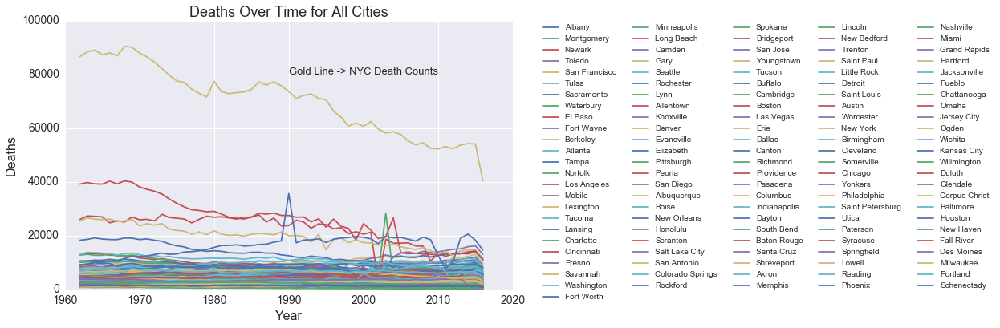

In [9]:
plt.figure(figsize=(10,6))
for c in allcities:
    plt.plot(deaths_by_city_and_year.loc[c].index, deaths_by_city_and_year.loc[c]['All Deaths'], label=c)
plt.title('Deaths Over Time for All Cities', fontsize=18)
plt.xlabel('Year', fontsize=16)
plt.ylabel('Deaths', fontsize=16)
plt.text(1990, 80000, 'Gold Line -> NYC Death Counts', fontsize=13)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
#plt.legend()
plt.legend(bbox_to_anchor=(1.05, -.07), loc=3, ncol=5)

/Users/christianrosado/anaconda/lib/python2.7/site-packages/matplotlib/scale.py:93: RuntimeWarning: invalid value encountered in less_equal
  mask = a <= 0.0


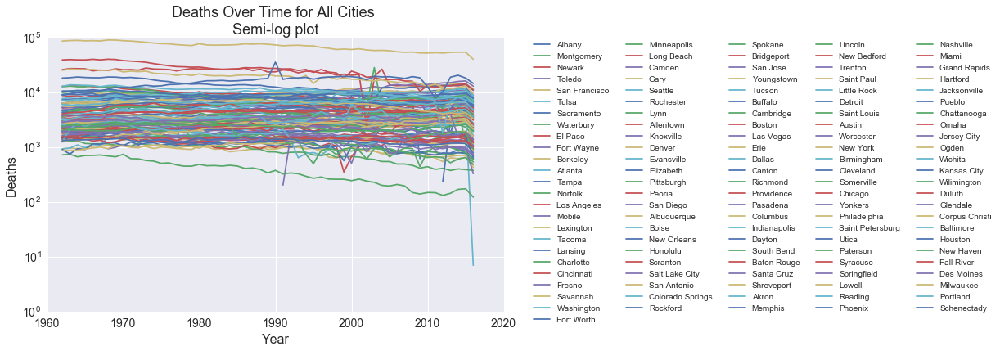

In [10]:
plt.figure(figsize=(10,6))
for c in allcities:
    plt.semilogy(deaths_by_city_and_year.loc[c].index, deaths_by_city_and_year.loc[c]['All Deaths'], label=c)
plt.title('Deaths Over Time for All Cities \nSemi-log plot', fontsize=18)
plt.xlabel('Year', fontsize=16)
plt.ylabel('Deaths', fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
#plt.legend()
plt.legend(bbox_to_anchor=(1.05, -.07), loc=3, ncol=5)

#### All deaths per city

/Users/christianrosado/anaconda/lib/python2.7/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


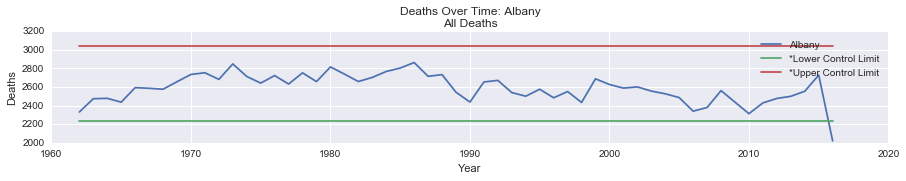

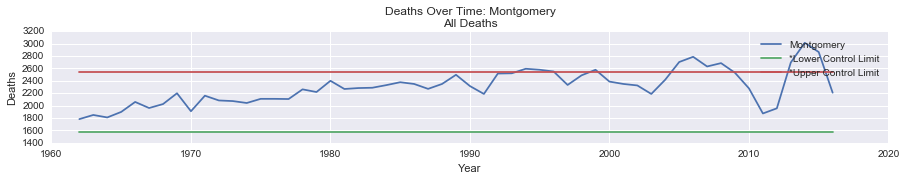

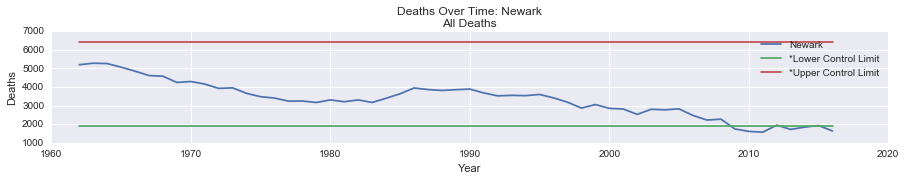

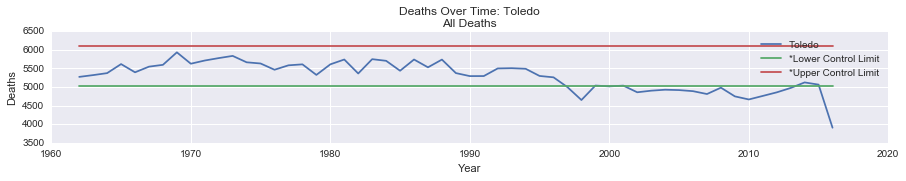

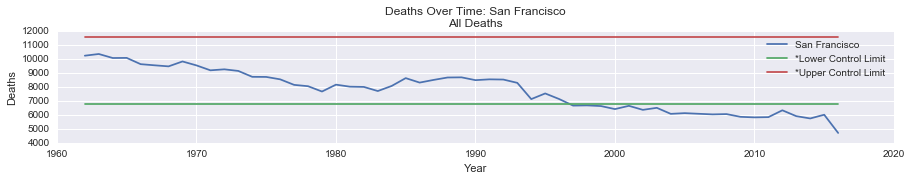

...

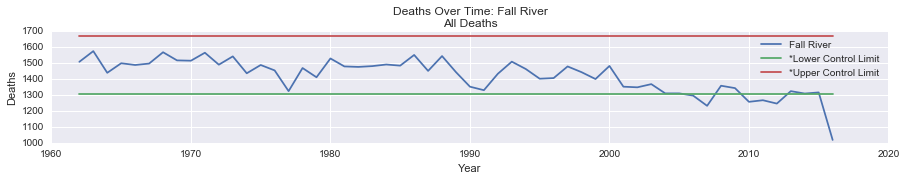

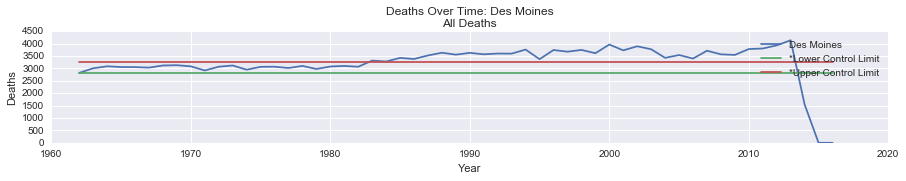

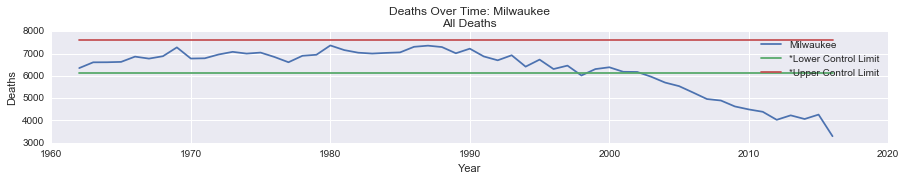

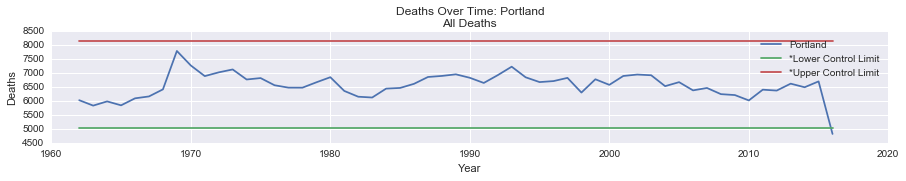

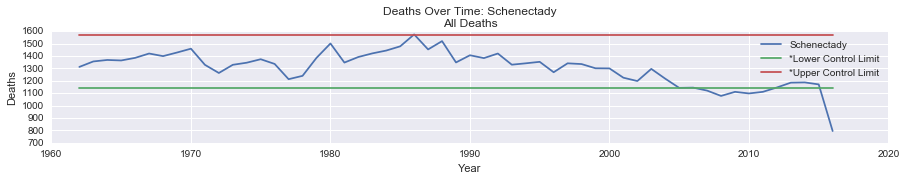

In [11]:
#death rate per city per age group
#time series analysis per city, event dedect spikes and drops
#see if there is periodicity for cities?

for c in allcities:
    mean = deaths_by_city_and_year.loc[c]['All Deaths'][:19].mean()
    sigma = deaths_by_city_and_year.loc[c]['All Deaths'][:19].std()
    threashhold = [[mean+(sigma*3)]*len(deaths_by_city_and_year.loc[c].index), [mean-(sigma*3)]*len(deaths_by_city_and_year.loc[c].index)]
    plt.figure(figsize=(15,2))
    plt.plot(deaths_by_city_and_year.loc[c].index, deaths_by_city_and_year.loc[c]['All Deaths'], label=c)
    plt.plot(deaths_by_city_and_year.loc[c].index, threashhold[1], label='*Lower Control Limit')
    plt.plot(deaths_by_city_and_year.loc[c].index, threashhold[0], label='*Upper Control Limit')
    plt.xlabel('Year', fontsize=11)
    plt.ylabel('Deaths', fontsize=11)
    plt.title('Deaths Over Time: '+ c + '\nAll Deaths')
    plt.legend()

#### Deaths for ages 25-44 per city

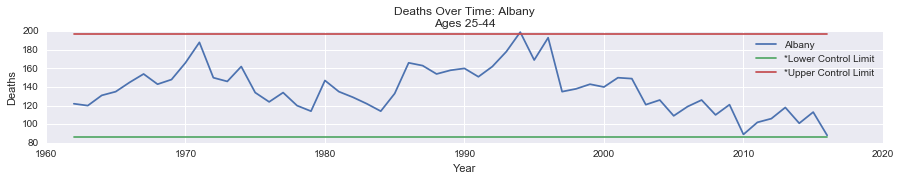

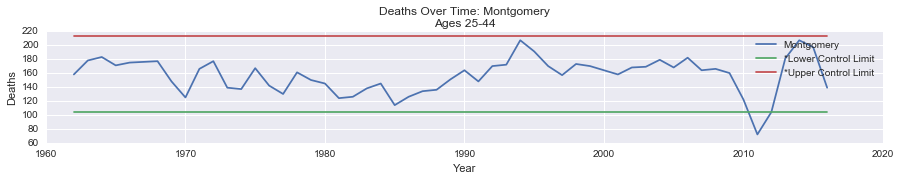

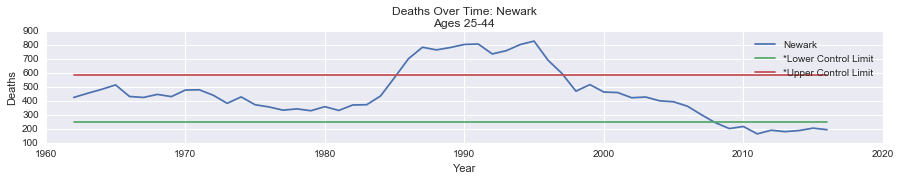

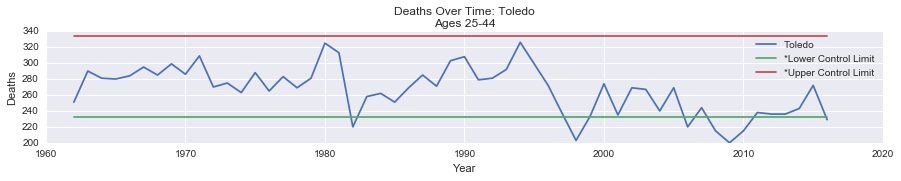

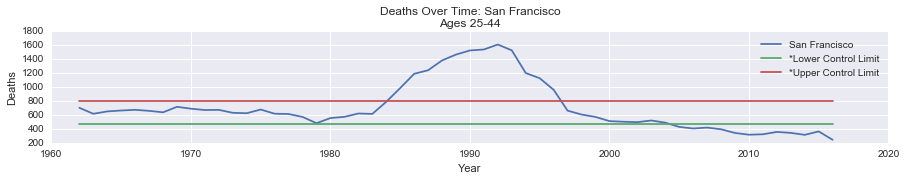

...

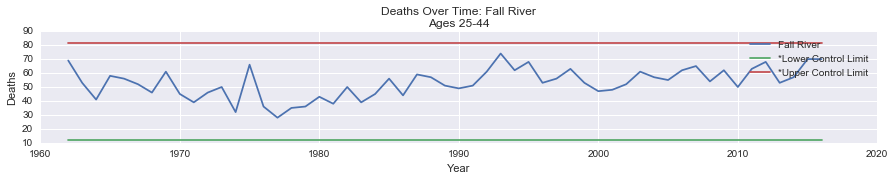

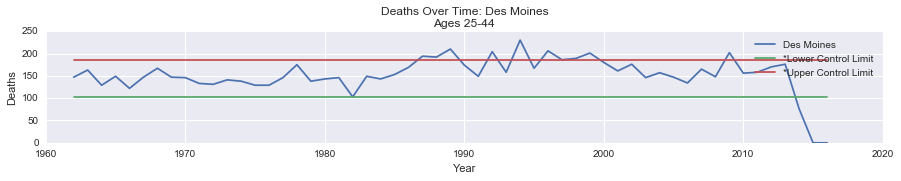

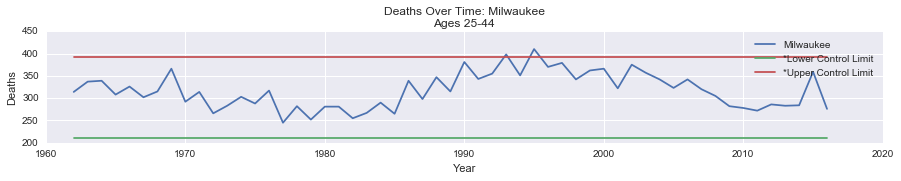

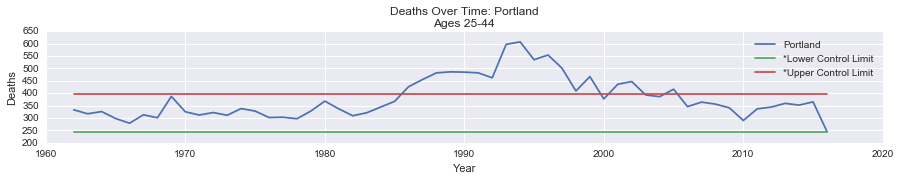

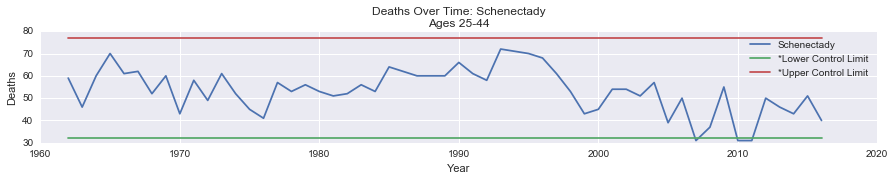

In [12]:
 for c in allcities:
    mean = deaths_by_city_and_year.loc[c]['25-44 years'][:19].mean()
    sigma = deaths_by_city_and_year.loc[c]['25-44 years'][:19].std()
    threashhold = [[mean+(sigma*3)]*len(deaths_by_city_and_year.loc[c].index), [mean-(sigma*3)]*len(deaths_by_city_and_year.loc[c].index)]
    plt.figure(figsize=(15,2))
    plt.plot(deaths_by_city_and_year.loc[c].index, deaths_by_city_and_year.loc[c]['25-44 years'], label=c)
    plt.plot(deaths_by_city_and_year.loc[c].index, threashhold[1], label='*Lower Control Limit')
    plt.plot(deaths_by_city_and_year.loc[c].index, threashhold[0], label='*Upper Control Limit')
    plt.xlabel('Year', fontsize=11)
    plt.ylabel('Deaths', fontsize=11)
    plt.title('Deaths Over Time: '+ c + '\nAges 25-44')
    plt.legend()

#### Data visualisation for all age groups

In [13]:
deaths_by_city_and_year.index[130]
#deaths_by_city_and_year['All Deaths'][0]

('Albuquerque', 1982)

In [14]:
city_deaths = {}

for i,j in enumerate(deaths_by_city_and_year.index):
    city = deaths_by_city_and_year.index[i][0] # 0 -> city 1 -> year
    year = deaths_by_city_and_year.index[i][1]
    deaths = deaths_by_city_and_year['All Deaths'][i]
            

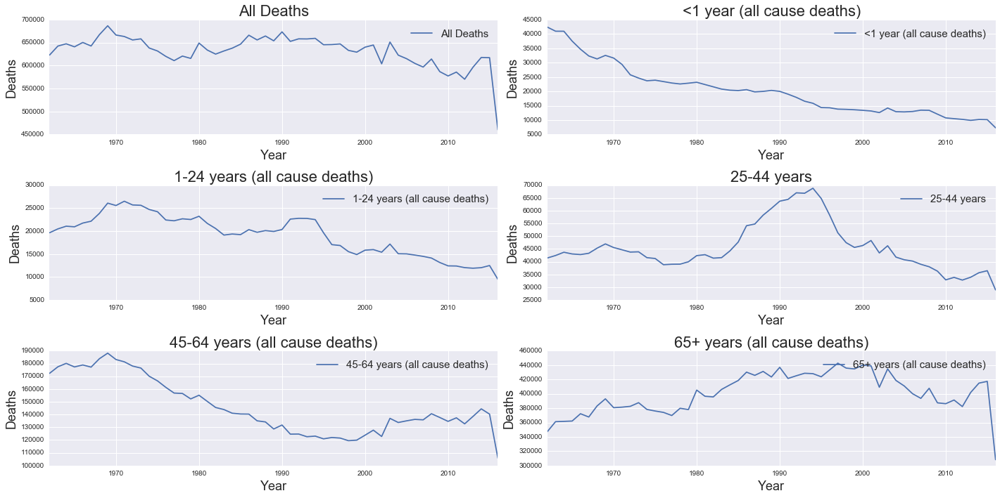

In [15]:
columns = ['All Deaths', '<1 year (all cause deaths)', '1-24 years (all cause deaths)',\
           '25-44 years', '45-64 years (all cause deaths)', '65+ years (all cause deaths)']
for i,j in zip(range(1,7),columns):
    ax = plt.subplot(3,2,i)
    plt.tight_layout()
    deaths_by_year.plot(deaths_by_year.index, j, figsize=(20, 10), ax=ax)
    plt.xlabel('Year', fontsize=18)
    plt.ylabel('Deaths', fontsize=18)
    plt.legend(fontsize=15)
    plt.title(j, fontsize=22)

There seems to be a spike in deaths in the 25-44 age group.

### Event Detection

In [16]:
mean = deaths_by_year['25-44 years'][:19].mean()
sigma = deaths_by_year['25-44 years'][:19].std()
threashhold = [[mean+(sigma*3)]*len(deaths_by_year.index), [mean-(sigma*3)]*len(deaths_by_year.index)]

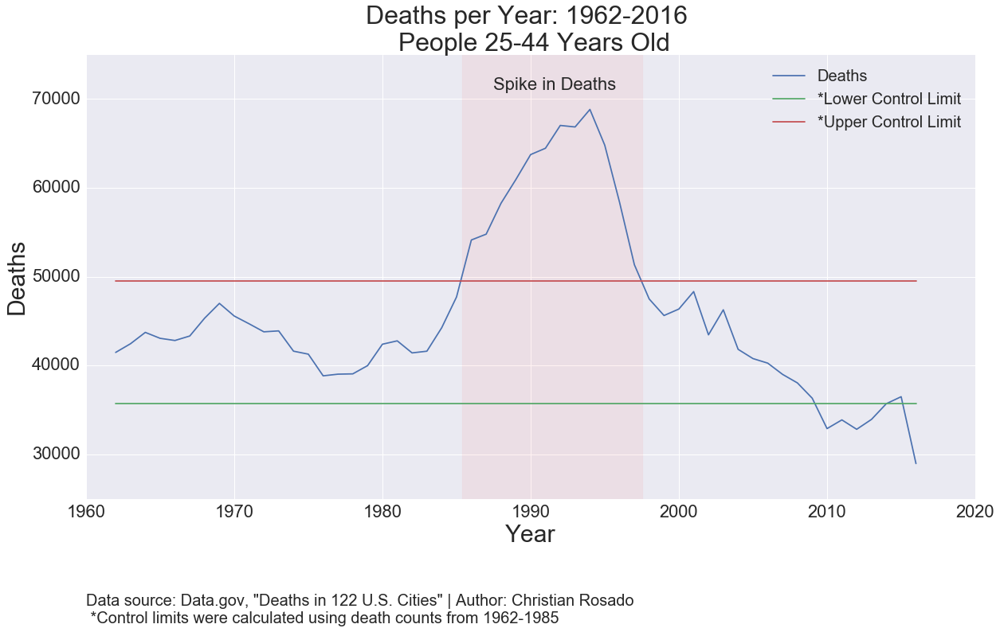

In [17]:
plt.figure(figsize=(20, 10))
plt.plot(deaths_by_year.index, deaths_by_year['25-44 years'], label='Deaths')
plt.plot(deaths_by_year.index, threashhold[1], label='*Lower Control Limit')
plt.plot(deaths_by_year.index, threashhold[0], label='*Upper Control Limit') #, color='#FF5A5A')
plt.xlabel('Year', fontsize=30)
plt.ylabel('Deaths', fontsize=30)
plt.legend(loc=0, fontsize=20)
plt.xticks(fontsize = 22) 
plt.yticks(fontsize = 22) 
plt.title('Deaths per Year: 1962-2016 \n People 25-44 Years Old', fontsize=32)
gca = plt.gca()
gca.set_ylim([25000,75000])
plt.annotate(s="Spike in Deaths", xy=(1987.5,71000), fontsize=22)
gca.add_patch(plt.Rectangle((1985.4,0), 12.2, 75600, alpha=.05, color="red"))
#plt.annotate(s="Drop \nin Deaths", xy=(2010,70000), fontsize=22)
#gca.add_patch(plt.Rectangle((2009.2,0), 7, 75600, alpha=.05, color="green"))
plt.text(1960, 11000, 'Data source: Data.gov, "Deaths in 122 U.S. Cities" | ' 
         'Author: Christian Rosado \n *Control limits were calculated using '
         'death counts from 1962-1985', fontsize=20)

#### Findings from event detection

The plot above shows a significant spike in deaths during the 80s and 90s decade. After doing some online research I learned that these two decades were plagued with high crime rates, drug use, and the HIV/AIDS epidemic. I also learned President Bill Clinton implemented the 1994 Crime Bill to cobate these statistics nationwide.   

In [18]:
# Drugs
#http://www.gallup.com/poll/6352/decades-drug-use-80s-90s.aspx

# HIV/AIDS
#https://www.cdc.gov/mmwr/preview/mmwrhtml/mm5021a2.htm

#crime rates
#http://www.nationalreview.com/corner/427758/careful-panic-violent-crime-and-gun-crime-are-both-dropping-charles-c-w-cooke
#http://www.forbes.com/sites/neilhowe/2015/05/28/whats-behind-the-decline-in-crime/#87e72c077336

#### More Exploratory Visualization

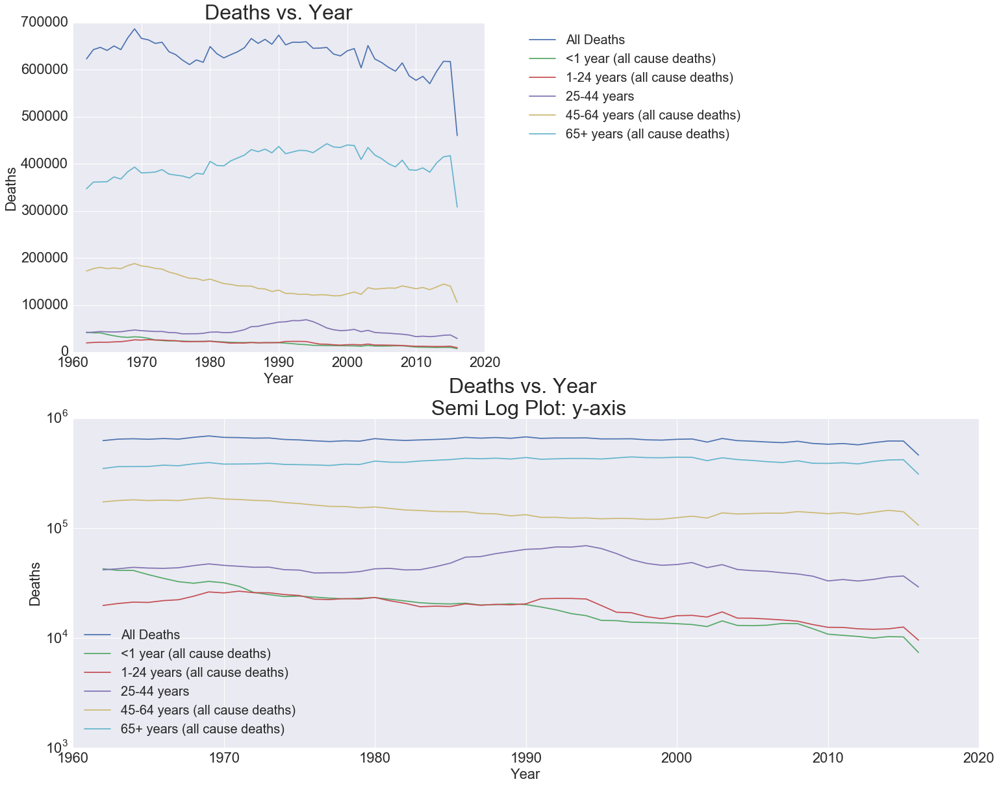

In [19]:
columns = ['All Deaths', '<1 year (all cause deaths)', '1-24 years (all cause deaths)',\
           '25-44 years', '45-64 years (all cause deaths)', '65+ years (all cause deaths)']

plt.figure(figsize=(25, 20))
plt.subplot(2,2,1)
for i,j in zip(range(1,7),columns):
    plt.plot(deaths_by_year.index, deaths_by_year[j])
plt.xlabel('Year', fontsize=22)
plt.ylabel('Deaths', fontsize=22)
plt.legend(loc='upper right', bbox_to_anchor=(1.65, 1), fontsize=20)
plt.xticks(fontsize = 22) 
plt.yticks(fontsize = 22) 
plt.title('Deaths vs. Year', fontsize=32)

#plt.figure(figsize=(25, 20))
plt.subplot(2,1,2)
for i,j in zip(range(1,7),columns):
    plt.semilogy(deaths_by_year.index, deaths_by_year[j])
plt.xlabel('Year', fontsize=22)
plt.ylabel('Deaths', fontsize=22)
plt.legend(loc=0, fontsize=20)
plt.xticks(fontsize = 22) 
plt.yticks(fontsize = 22) 
plt.title('Deaths vs. Year \n Semi Log Plot: y-axis', fontsize=32)

### Processing Data for Clustering Analysis

In [20]:
deaths_by_city_and_year.head()

WEEK  REGION  Pneumonia and Influenza Deaths  All Deaths  \
City  Year                                                             
Akron 1962  1378     156                            40.0      2920.0   
      1963  1378     156                            63.0      3210.0   
      1964  1431     159                            30.0      3182.0   
      1965  1378     156                            32.0      3308.0   
      1966  1378     156                             5.0      3375.0   

            <1 year (all cause deaths)  1-24 years (all cause deaths)  \
City  Year                                                              
Akron 1962                       234.0                           88.0   
      1963                       210.0                          111.0   
      1964                       201.0                          128.0   
      1965                       203.0                          127.0   
      1966                       222.0                          129.0   

            25-44 years  45-64 years (all cause deaths)  \
City  Year                                                
Akron 1962        208.0                           782.0   
      1963        190.0                           944.0   
      1964        199.0                           883.0   
      1965        197.0                           927.0   
      1966        204.0                           821.0   

            65+ years (all cause deaths)  
City  Year                                
Akron 1962                        1608.0  
      1963                        1755.0  
      1964                        1771.0  
      1965                        1854.0  
      1966                        1999.0

In [21]:
deaths_by_city_and_year.index[i][0] == 'Akron'

True

In [22]:
np.array(deaths_by_city_and_year.loc[c]['All Deaths'])-70000

array([-68688., -68644., -68632., -68636., -68615., -68580., -68601.,
       -68572., -68541., -68671., -68737., -68671., -68654., -68626.,
       -68664., -68787., -68760., -68615., -68499., -68653., -68608.,
       -68579., -68556., -68522., -68426., -68547., -68480., -68652.,
       -68594., -68617., -68580., -68670., -68659., -68647., -68731.,
       -68659., -68665., -68699., -68700., -68775., -68802., -68704.,
       -68783., -68857., -68855., -68879., -68922., -68889., -68902.,
       -68889., -68854., -68815., -68813., -68829., -69205.])

In [23]:
df_all_deaths = pd.DataFrame(columns=['deaths', 'city', 'year'])
df_age_group_subset = pd.DataFrame(columns=['deaths', 'city', 'year'])

In [24]:
df_all_deaths

,deaths,city,year


#### Normalizing deaths for ages 25-44 years

In [25]:
for c in allcities:
    deaths2 = np.array(deaths_by_city_and_year.loc[c]['25-44 years'])
    normalized2 = (deaths2-min(deaths2))/(max(deaths2)-min(deaths2))
    print normalized2
    deaths_2 = pd.DataFrame(data=normalized2, columns=['deaths'])
    #df.append(deaths)
    city2 = []
    i=1
    while i <= len(deaths2):
        city2.append(c)
        i += 1
    print city2
    city_2 = pd.DataFrame(data=city2, columns=['city'])
    year2 = list(deaths_by_city_and_year.loc[c]['25-44 years'].index)
    print year2
    year_2 = pd.DataFrame(data=year2, columns=['year'])
    df_age_group_subset_ = pd.concat([deaths_2, city_2, year_2], axis=1)
    df_age_group_subset = df_age_group_subset.append(df_age_group_subset_, ignore_index=True)

[ 0.30630631  0.28828829  0.38738739  0.42342342  0.51351351  0.59459459
  0.4954955   0.54054054  0.7027027   0.9009009   0.55855856  0.52252252
  0.66666667  0.41441441  0.32432432  0.41441441  0.28828829  0.23423423
  0.53153153  0.42342342  0.36936937  0.30630631  0.23423423  0.40540541
  0.7027027   0.67567568  0.59459459  0.63063063  0.64864865  0.56756757
  0.66666667  0.81081081  1.          0.72972973  0.94594595  0.42342342
  0.45045045  0.4954955   0.46846847  0.55855856  0.54954955  0.2972973
  0.34234234  0.18918919  0.27927928  0.34234234  0.1981982   0.2972973
  0.00900901  0.12612613  0.16216216  0.27027027  0.11711712  0.22522523
  0.        ]
['Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 

In [26]:
df_age_group_subset

,deaths,city,year
0,0.306306,Albany,1962.0
1,0.288288,Albany,1963.0
2,0.387387,Albany,1964.0
3,0.423423,Albany,1965.0
4,0.513514,Albany,1966.0
5,0.594595,Albany,1967.0
6,0.495495,Albany,1968.0
7,0.540541,Albany,1969.0
8,0.702703,Albany,1970.0
9,0.900901,Albany,1971.0


In [27]:
df_age_group_subset.describe()

,deaths,year
count,6502.000000,6505.000000
mean,0.459682,1989.190469
std,0.259598,15.862256
min,0.000000,1962.000000
25%,0.255734,1975.000000
50%,0.443348,1989.000000
75%,0.652632,2003.000000
max,1.000000,2016.000000


#### Normalizing deaths for All Deaths

In [28]:
for c in allcities:
    deaths = np.array(deaths_by_city_and_year.loc[c]['All Deaths'])
    normalized = (deaths-min(deaths))/(max(deaths)-min(deaths))
    print deaths
    deaths_ = pd.DataFrame(data=normalized, columns=['deaths'])
    #df.append(deaths)
    city = []
    i=1
    while i <= len(deaths):
        city.append(c)
        i += 1
    print city
    city_ = pd.DataFrame(data=city, columns=['city'])
    year = list(deaths_by_city_and_year.loc[c]['25-44 years'].index)
    print year
    year_ = pd.DataFrame(data=year, columns=['year'])
    df_all_deaths_ = pd.concat([deaths_, city_, year_], axis=1)
    df_all_deaths = df_all_deaths.append(df_all_deaths_, ignore_index=True)

[ 2331.  2474.  2478.  2437.  2593.  2586.  2576.  2657.  2735.  2753.
  2682.  2848.  2713.  2642.  2723.  2632.  2752.  2658.  2816.  2739.
  2659.  2703.  2767.  2804.  2863.  2715.  2733.  2544.  2438.  2654.
  2671.  2540.  2501.  2576.  2484.  2551.  2434.  2688.  2627.  2588.
  2601.  2556.  2527.  2486.  2340.  2380.  2561.  2437.  2313.  2429.
  2477.  2500.  2554.  2728.  2021.]
['Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany', 'Albany']
[1962, 1963, 1964, 1965, 1966, 1967, 1968, 1969, 1970, 19

In [29]:
df_all_deaths

,deaths,city,year
0,0.368171,Albany,1962.0
1,0.538005,Albany,1963.0
2,0.542755,Albany,1964.0
3,0.494062,Albany,1965.0
4,0.679335,Albany,1966.0
5,0.671021,Albany,1967.0
6,0.659145,Albany,1968.0
7,0.755344,Albany,1969.0
8,0.847981,Albany,1970.0
9,0.869359,Albany,1971.0


In [30]:
df_all_deaths.describe()

,deaths,year
count,6502.000000,6505.000000
mean,0.545935,1989.190469
std,0.279439,15.862256
min,0.000000,1962.000000
25%,0.320116,1975.000000
50%,0.578107,1989.000000
75%,0.775635,2003.000000
max,1.000000,2016.000000


#### Visualization of a test plot to ensure shape of series was not changed by the normalization process

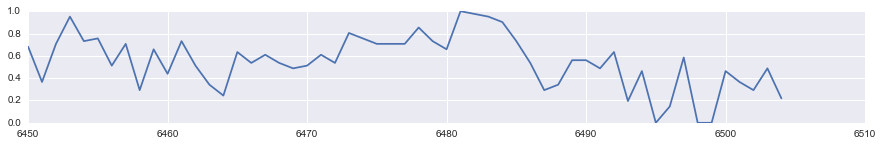

In [31]:
# TEST PLOT
plt.figure(figsize=(15,2))
plt.plot(df_age_group_subset.deaths[df_age_group_subset.city == 'Schenectady'])

#### Dropping Nan values from processed data

Not all series have the same length due to nan values. 

In [32]:
# verifying cities with length > 55
for c in allcities:
    if len(df_age_group_subset.deaths[df_age_group_subset.city == c]) == 55:
        pass
    else:
        print c

Lexington
Lansing
Fort Worth
Pittsburgh
Boise
New Orleans
Las Vegas
Santa Cruz
Philadelphia


In [33]:
# Printing lengths for cities with length > 55
for c in allcities:
    if len(df_age_group_subset.deaths[df_age_group_subset.city == c]) == 55:
        pass
    else:
        print len(df_age_group_subset.deaths[df_age_group_subset.city == c])

25
20
48
54
20
52
49
26
51


In [34]:
#### A test visualization of series with different lengths

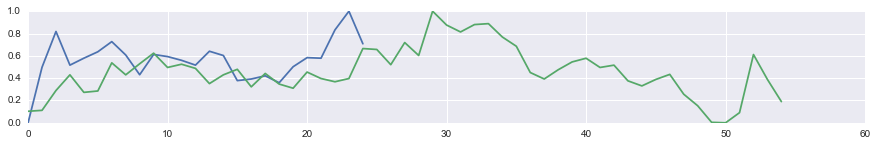

In [35]:
plt.figure(figsize=(15,2))
plt.plot(range(len(df_age_group_subset.deaths[df_age_group_subset.city == 'Lexington'])),df_age_group_subset.deaths[df_age_group_subset.city == 'Lexington'], label=c)

plt.plot(range(len(df_age_group_subset.deaths[df_age_group_subset.city == 'Rochester'])),df_age_group_subset.deaths[df_age_group_subset.city == 'Rochester'], label=c)

#### Normalized visualizatio of all series for deaths: ages 24-44

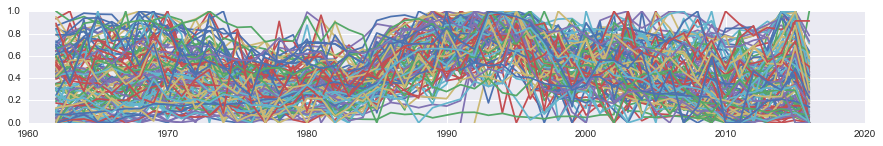

In [36]:
# normalized city time series for deaths: ages 24-44
plt.figure(figsize=(15,2))
for c in allcities:
    plt.plot(df_age_group_subset.year[df_age_group_subset.city == c], df_age_group_subset.deaths[df_age_group_subset.city == c], label=c)

#### Normalized visualizatio of all series for All Deaths

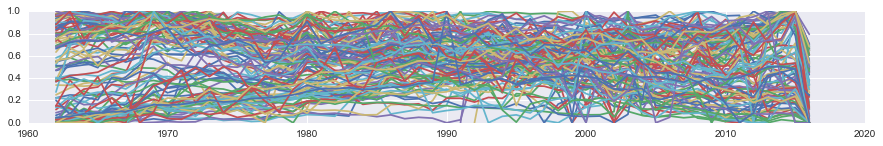

In [37]:
# normalized city time series for all deaths

plt.figure(figsize=(15,2))
for c in allcities:
    plt.plot(df_all_deaths.year[df_all_deaths.city == c], df_all_deaths.deaths[df_all_deaths.city == c], label=c)

### Prepering Data Frame for Clustering Analysis - All Deaths

In [38]:
df_all_deaths_cluster = pd.DataFrame(columns=allcities, index=range(1962,2017))

In [39]:
df_all_deaths_cluster.T.head()

,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
Albany,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Montgomery,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Newark,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Toledo,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
San Francisco,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [40]:
# adding normalized death counts to empty cells - All Deaths
for c in allcities:
    year = df_all_deaths.year[df_all_deaths.city == c]
    for y in year:
        df_all_deaths_cluster.set_value(y,c,np.array(df_all_deaths.deaths[df_all_deaths.city == c][df_all_deaths.year == y])[0])

In [41]:
df_all_deaths_cluster.T.head()

,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
Albany,0.368171,0.538005,0.542755,0.494062,0.679335,0.671021,0.659145,0.755344,0.847981,0.869359,...,0.426366,0.64133,0.494062,0.346793,0.484561,0.541568,0.568884,0.633017,0.839667,0
Montgomery,0,0.0544273,0.0219334,0.0942323,0.22502,0.14541,0.1974,0.338749,0.103168,0.307067,...,0.689683,0.73355,0.606824,0.402924,0.0739236,0.141348,0.741673,1,0.87896,0.34606
Newark,0.978413,1,0.995413,0.942795,0.885051,0.821101,0.811657,0.721263,0.734754,0.697787,...,0.175661,0.188343,0.0469509,0.0107933,0,0.101997,0.0396654,0.0731247,0.0957906,0.0169995
Toledo,0.674235,0.697927,0.724087,0.844028,0.734946,0.80997,0.834156,1,0.848963,0.891412,...,0.446693,0.531096,0.415597,0.37463,0.42152,0.468904,0.527147,0.600691,0.57157,0
San Francisco,0.978622,1,0.949117,0.95053,0.871201,0.856714,0.843286,0.905477,0.855654,0.793286,...,0.235159,0.238869,0.204064,0.19735,0.200353,0.286926,0.212544,0.183569,0.230742,0


# Clustering 

### KMeans for All Deaths

In [42]:
colors = ['#D91F1F', '#952540', '#502C61', '#0C3383', '#25957a', '#87CEEB', '#FF5721', 'w'] 

In [43]:
from sklearn.cluster import KMeans

In [44]:
# drop series with nan values - empty years
df_all_deaths_cluster.dropna(axis=1, inplace=True)

In [45]:
km = KMeans(n_clusters=3, random_state=1162)
labels = km.fit_predict(df_all_deaths_cluster.T)

In [46]:
labels

array([2, 1, 0, 2, 0, 1, 1, 2, 1, 1, 2, 2, 1, 2, 2, 1, 1, 1, 0, 1, 1, 2, 0,
       0, 2, 0, 2, 2, 0, 0, 1, 2, 1, 0, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 1,
       2, 1, 0, 0, 0, 1, 1, 2, 2, 2, 0, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 2, 0,
       1, 0, 0, 1, 2, 0, 1, 1, 0, 0, 0, 0, 0, 0, 2, 2, 2, 0, 1, 1, 2, 1, 2,
       1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 2, 2, 2, 2, 2, 2], dtype=int32)

(array([ 0. ,  0.2,  0.4,  0.6,  0.8,  1. ]),
 <a list of 6 Text yticklabel objects>)

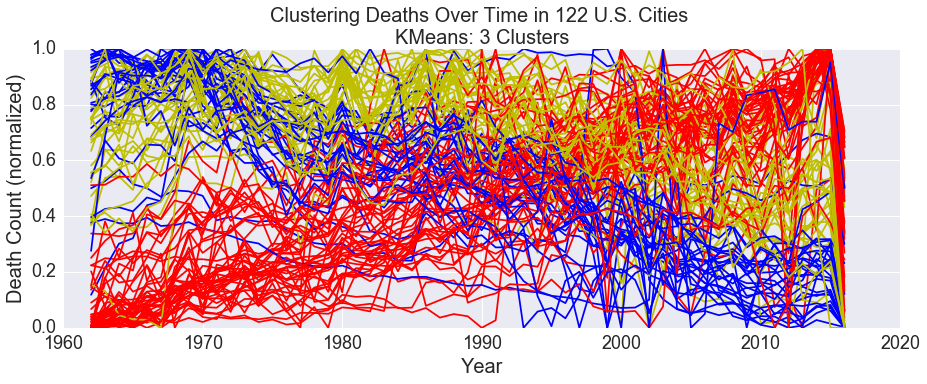

In [47]:
# 6 clusters of normalized city time series for all deaths - kMeans

plt.figure(figsize=(15,5))
for c,color in zip(df_all_deaths_cluster.columns,labels):
    plt.plot(df_all_deaths_cluster.index, df_all_deaths_cluster[c], label=c, color='b' if color == 0 \
                                                                                    else 'r' if color == 1 \
                                                                                    else 'y' if color == 2 \
                                                                                    else 'hotpink' if color == 3 \
                                                                                    else 'orange' if color == 4 \
                                                                                    else 'g')
plt.title('Clustering Deaths Over Time in 122 U.S. Cities \
\nKMeans: 3 Clusters', fontsize=20)
plt.xlabel('Year', fontsize=20)
plt.ylabel('Death Count (normalized)', fontsize=20)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

### DBSCANS for All Deaths

In [48]:
from sklearn.cluster import DBSCAN

In [49]:
db = DBSCAN(eps=.9, min_samples=10)
labels = db.fit_predict(df_all_deaths_cluster.T)

In [50]:
labels

array([-1, -1,  0, -1,  0,  1,  1, -1,  1,  1, -1, -1, -1, -1, -1,  1,  1,
        1,  0,  1,  1,  0, -1, -1,  0, -1, -1, -1,  0, -1,  1, -1, -1,  0,
        1, -1,  1, -1, -1,  1,  1,  1,  1, -1,  0, -1, -1,  1,  0,  0,  0,
       -1, -1, -1,  0, -1,  0,  1,  1,  1, -1, -1, -1, -1, -1,  1, -1,  0,
       -1, -1,  0, -1,  1, -1,  0,  1, -1,  0,  0,  0, -1,  0,  0, -1, -1,
        0, -1, -1,  1, -1, -1, -1, -1, -1,  1, -1,  0,  1, -1,  0, -1, -1,
       -1,  1,  0, -1,  0, -1, -1, -1, -1, -1])

(array([ 0. ,  0.2,  0.4,  0.6,  0.8,  1. ]),
 <a list of 6 Text yticklabel objects>)

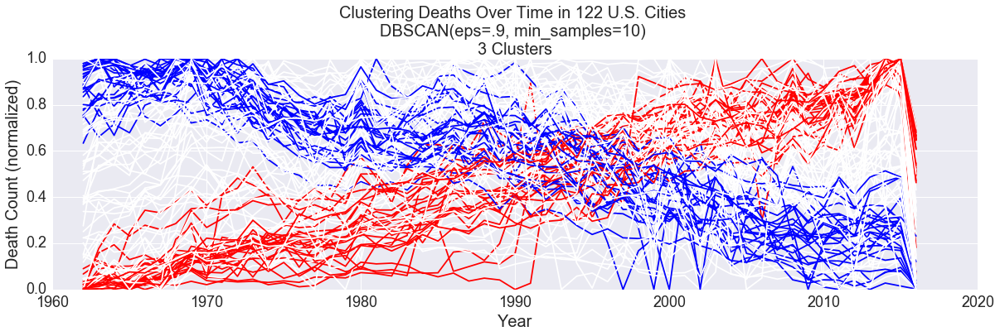

In [51]:
# n clusters of normalized city time series for all deaths - DBSCAN

plt.figure(figsize=(20,5))
for c,color in zip(df_all_deaths_cluster.columns,labels):
    plt.plot(df_all_deaths_cluster.index, df_all_deaths_cluster[c], label=c, color='b' if color == 0 \
                                                                                    else 'r' if color == 1 \
                                                                                    else 'y' if color == 2 \
                                                                                    else 'pink' if color == 3 \
                                                                                    else 'orange' if color == 4 \
                                                                                    else 'w')
plt.title('Clustering Deaths Over Time in 122 U.S. Cities \nDBSCAN(eps=.9, min_samples=10) \
\n3 Clusters', fontsize=20)
plt.xlabel('Year', fontsize=20)
plt.ylabel('Death Count (normalized)', fontsize=20)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

# Cluster Means for All Deaths

In [52]:
df_all_deaths_cluster_Labels = df_all_deaths_cluster.T.astype(float).copy()
df_all_deaths_cluster_Labels["label"] = labels.astype(float)

df_all_deaths_cluster_Labels_Mean = df_all_deaths_cluster_Labels.groupby(['label']).mean()

In [45]:
df_all_deaths_cluster_Labels_Mean.head()

,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
label,,,,,,,,,,,,,,,,,,,,,
-1.0,0.407297,0.463428,0.470305,0.481669,0.501471,0.498818,0.559678,0.635878,0.595976,0.599542,...,0.524409,0.568155,0.526952,0.495466,0.532088,0.480007,0.568007,0.619158,0.652098,0.177716
0.0,0.875857,0.909085,0.898921,0.891078,0.902417,0.895438,0.922674,0.935721,0.890063,0.870650,...,0.260938,0.265018,0.215024,0.227879,0.230014,0.218672,0.242759,0.252937,0.248258,0.019726
1.0,0.012194,0.049075,0.056165,0.052240,0.081810,0.082180,0.128240,0.166135,0.144589,0.172140,...,0.733923,0.810806,0.757924,0.775687,0.818908,0.807131,0.880182,0.960830,0.975181,0.553946


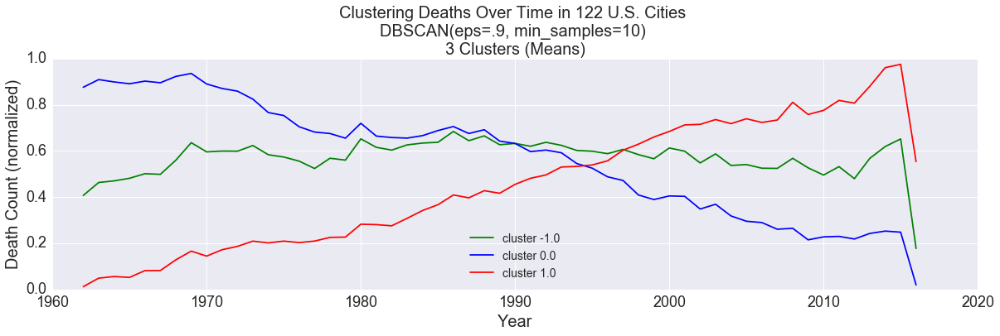

In [54]:
# n clusters of normalized city time series for all deaths

plt.figure(figsize=(20,5))
for c in df_all_deaths_cluster_Labels_Mean.index:
    plt.plot(df_all_deaths_cluster_Labels_Mean.columns, df_all_deaths_cluster_Labels_Mean.loc[c], \
                                                                                   label='cluster '+str(c),\ 
                                                                                   color='b' if c == 0 \
                                                                                    else 'r' if c == 1 \
                                                                                    else 'y' if c == 2 \
                                                                                    else 'hotpink' if c == 3 \
                                                                                    else 'orange' if c == 4 \
                                                                                    else 'g')
plt.title('Clustering Deaths Over Time in 122 U.S. Cities \
\nDBSCAN(eps=.9, min_samples=10) \n3 Clusters (Means)', fontsize=20)
plt.xlabel('Year', fontsize=20)
plt.ylabel('Death Count (normalized)', fontsize=20)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.legend(loc=0, fontsize=14)

### Prepering Data Frame for Clustering Analysis - Ages 25-44

In [47]:
df_age_group_subset_cluster = pd.DataFrame(columns=allcities, index=range(1962,2017))

In [48]:
df_age_group_subset_cluster.T.head()

,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
Albany,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Montgomery,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Newark,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Toledo,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
San Francisco,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [49]:
# adding normalized death counts to empty cells - All Deaths
for c in allcities:
    year = df_age_group_subset.year[df_age_group_subset.city == c]
    for y in year:
        df_age_group_subset_cluster.set_value(y,c,\
        np.array(df_age_group_subset.deaths[df_age_group_subset.city == c][df_age_group_subset.year == y])[0])

In [50]:
df_age_group_subset_cluster.T.head()

,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
Albany,0.306306,0.288288,0.387387,0.423423,0.513514,0.594595,0.495495,0.540541,0.702703,0.900901,...,0.342342,0.198198,0.297297,0.00900901,0.126126,0.162162,0.27027,0.117117,0.225225,0
Montgomery,0.637037,0.785185,0.822222,0.733333,0.762963,0.77037,0.777778,0.562963,0.392593,0.696296,...,0.681481,0.696296,0.651852,0.37037,0,0.237037,0.807407,1,0.925926,0.496296
Newark,0.392481,0.437594,0.479699,0.52782,0.403008,0.392481,0.425564,0.401504,0.47218,0.475188,...,0.206015,0.120301,0.0571429,0.0796992,0,0.0390977,0.0240602,0.0360902,0.0616541,0.0451128
Toledo,0.404762,0.714286,0.642857,0.634921,0.666667,0.753968,0.674603,0.785714,0.68254,0.865079,...,0.349206,0.119048,0,0.119048,0.301587,0.285714,0.285714,0.34127,0.571429,0.230159
San Francisco,0.336018,0.27306,0.29795,0.307467,0.314788,0.303807,0.288433,0.346266,0.326501,0.312592,...,0.128111,0.110542,0.0717423,0.0534407,0.0578331,0.0827233,0.0724744,0.0519766,0.0878477,0


# Clustering 
### KMeans for Ages 25-44

In [51]:
# drop series with nan values - empty years
df_age_group_subset_cluster.dropna(axis=1, inplace=True)

In [52]:
km = KMeans(n_clusters=4, random_state=1162)
labels = km.fit_predict(df_age_group_subset_cluster.T)

In [53]:
labels

array([1, 2, 1, 3, 1, 0, 0, 1, 0, 0, 1, 1, 0, 2, 1, 0, 0, 0, 3, 0, 1, 2, 1,
       1, 1, 3, 2, 1, 1, 3, 0, 2, 0, 1, 0, 1, 0, 1, 3, 0, 0, 0, 0, 0, 1, 0,
       3, 0, 3, 3, 3, 2, 1, 3, 2, 3, 1, 0, 0, 0, 0, 0, 2, 3, 1, 0, 0, 2, 1,
       0, 2, 1, 0, 0, 1, 0, 3, 3, 3, 1, 0, 2, 1, 1, 1, 1, 3, 0, 0, 1, 1, 1,
       0, 0, 0, 2, 1, 0, 0, 2, 3, 1, 1, 0, 1, 1, 2, 0, 2, 1, 1, 2], dtype=int32)

(array([ 0. ,  0.2,  0.4,  0.6,  0.8,  1. ]),
 <a list of 6 Text yticklabel objects>)

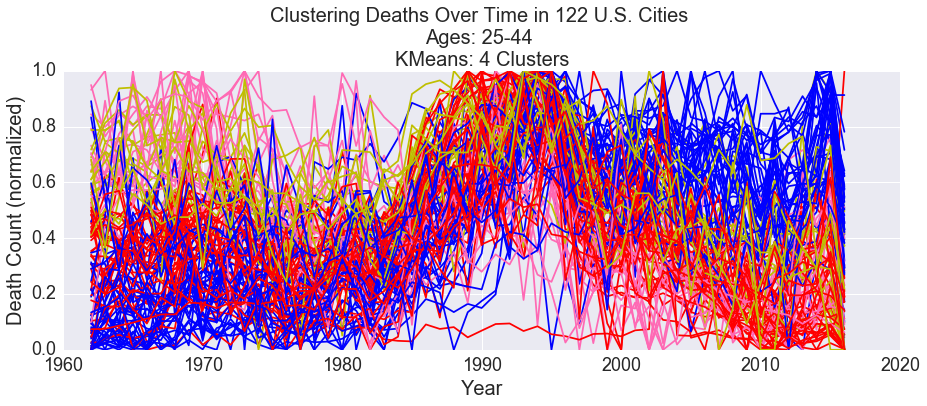

In [54]:
# 6 clusters of normalized city time series for deaths: ages 24-44 - kMeans

plt.figure(figsize=(15,5))
for c,color in zip(df_age_group_subset_cluster,labels):
    plt.plot(df_age_group_subset_cluster.index, df_age_group_subset_cluster[c], label=c, color='b' if color == 0 \
                                                                                    else 'r' if color == 1 \
                                                                                    else 'y' if color == 2 \
                                                                                    else 'hotpink' if color == 3 \
                                                                                    else 'orange' if color == 4 \
                                                                                    else 'g')
plt.title('Clustering Deaths Over Time in 122 U.S. Cities \nAges: 25-44 \
\nKMeans: 4 Clusters', fontsize=20)
plt.xlabel('Year', fontsize=20)
plt.ylabel('Death Count (normalized)', fontsize=20)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

### DBSCANS for Ages 25-44

In [118]:
db = DBSCAN(eps=.99, min_samples=2)
labels = db.fit_predict(df_age_group_subset_cluster.T)

In [119]:
labels

array([-1, -1,  0, -1,  0,  1,  1, -1,  1, -1,  0, -1, -1,  0,  0, -1,  2,
        1, -1,  1, -1,  0, -1,  0, -1, -1,  0, -1, -1, -1, -1,  0, -1, -1,
       -1,  0, -1,  0, -1,  2, -1,  1, -1, -1,  0, -1, -1, -1, -1,  0,  0,
       -1,  0, -1,  0, -1,  0, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1,  1, -1,  0, -1, -1, -1,  0, -1, -1, -1,  0, -1, -1,
       -1, -1,  1, -1,  0, -1,  0, -1, -1, -1, -1,  0, -1, -1, -1, -1, -1,
       -1, -1, -1, -1,  0, -1, -1, -1,  0, -1])

(array([ 0. ,  0.2,  0.4,  0.6,  0.8,  1. ]),
 <a list of 6 Text yticklabel objects>)

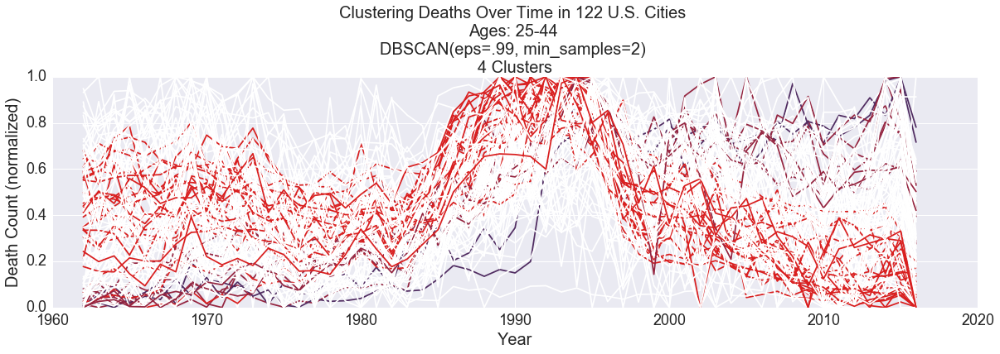

In [121]:
# n clusters of normalized city time series for deaths: ages 24-44 - DBSCAN
colors = ['#D91F1F', '#952540', '#502C61', '#0C3383', '#25957a', '#87CEEB', '#FF5721', 'w'] 
plt.figure(figsize=(20,5))
for c,color in zip(df_age_group_subset_cluster.columns,labels):
    plt.plot(df_age_group_subset_cluster.index, df_age_group_subset_cluster[c], label=c, \
                                                                                   color=colors[0] if color == 0 \
                                                                                    else colors[1] if color == 1 \
                                                                                    else colors[2] if color == 2 \
                                                                                    else colors[3] if color == 3 \
                                                                                    else colors[4] if color == 4 \
                                                                                    else colors[7])
plt.title('Clustering Deaths Over Time in 122 U.S. Cities \nAges: 25-44 \
\nDBSCAN(eps=.99, min_samples=2) \n4 Clusters', fontsize=20)
plt.xlabel('Year', fontsize=20)
plt.ylabel('Death Count (normalized)', fontsize=20)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
#plt.legend(loc=0)

# Cluster Means for Ages 25-44

In [58]:
df_age_group_subset_cluster_Labels = df_age_group_subset_cluster.T.astype(float).copy()
df_age_group_subset_cluster_Labels["label"] = labels.astype(float)

df_age_group_subset_cluster_Labels_Mean = df_age_group_subset_cluster_Labels.groupby(['label']).mean()

In [59]:
df_age_group_subset_cluster_Labels_Mean.head()

,1962,1963,1964,1965,1966,1967,1968,1969,1970,1971,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
label,,,,,,,,,,,,,,,,,,,,,
-1.0,0.371592,0.389672,0.404802,0.426380,0.407329,0.423603,0.441508,0.482840,0.441573,0.436413,...,0.419900,0.403569,0.409984,0.313157,0.369374,0.317636,0.395785,0.457367,0.531191,0.290308
0.0,0.392598,0.396227,0.431682,0.415359,0.393869,0.405335,0.436568,0.493535,0.452775,0.438871,...,0.262023,0.213469,0.172713,0.173079,0.173510,0.162420,0.162649,0.173221,0.163454,0.038674
1.0,0.017286,0.058294,0.045198,0.056432,0.056719,0.085211,0.116829,0.136416,0.119837,0.121966,...,0.688210,0.621102,0.656794,0.546315,0.620917,0.616795,0.648063,0.779573,0.762129,0.450419
2.0,0.003636,0.039165,0.046683,0.028010,0.057297,0.071744,0.068698,0.123980,0.125111,0.075430,...,0.764767,0.861376,0.799312,0.749484,0.787371,0.799754,0.871007,0.907764,0.996364,0.748845


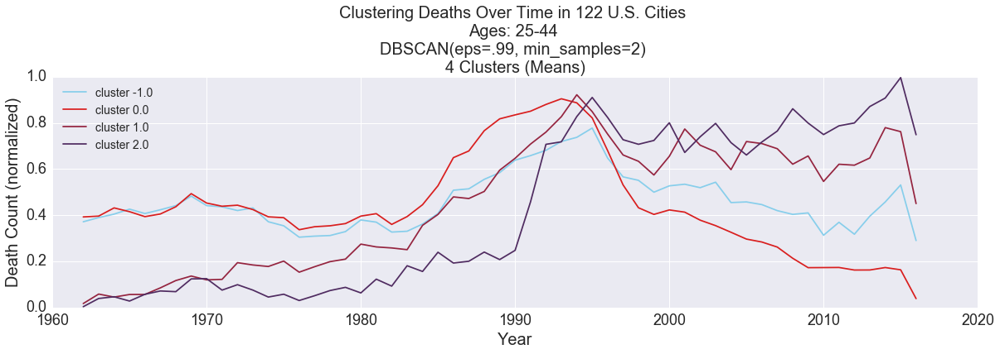

In [69]:
# Cluster Means
# n clusters of normalized city time series for deaths: ages 24-44 - DBSCAN
colors = ['#D91F1F', '#952540', '#502C61', '#0C3383', '#25957a', '#87CEEB', '#FF5721', 'w'] 
plt.figure(figsize=(20,5))
for c in df_age_group_subset_cluster_Labels_Mean.index:
    plt.plot(df_age_group_subset_cluster_Labels_Mean.columns, df_age_group_subset_cluster_Labels_Mean.loc[c], \
                                                                          label='cluster '+ str(c), \
                                                                                   color=colors[0] if c == 0 \
                                                                                    else colors[1] if c == 1 \
                                                                                    else colors[2] if c == 2 \
                                                                                    else colors[3] if c == 3 \
                                                                                    else colors[4] if c == 4 \
                                                                                    else colors[5])
plt.title('Clustering Deaths Over Time in 122 U.S. Cities \nAges: 25-44 \
\nDBSCAN(eps=.99, min_samples=2) \n4 Clusters (Means)', fontsize=20)
plt.xlabel('Year', fontsize=20)
plt.ylabel('Death Count (normalized)', fontsize=20)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.legend(loc=0, fontsize=14)

In [61]:
# high death count cities
df_age_group_subset_cluster_Labels.index[df_age_group_subset_cluster_Labels.label == 2]

Index([u'Tacoma', u'Salt Lake City'], dtype='object')

In [62]:
df_age_group_subset_cluster_Labels.index[df_age_group_subset_cluster_Labels.label == 1]

Index([u'Tulsa', u'Sacramento', u'El Paso', u'Charlotte', u'Fresno',
       u'Colorado Springs', u'Austin', u'Phoenix'],
      dtype='object')

In [63]:
df_age_group_subset_cluster_Labels.index[df_age_group_subset_cluster_Labels.label == -1]

Index([u'Albany', u'Montgomery', u'Toledo', u'Waterbury', u'Fort Wayne',
       u'Atlanta', u'Tampa', u'Mobile', u'Cincinnati', u'Savannah',
       u'Minneapolis', u'Camden', u'Gary', u'Rochester', u'Lynn', u'Allentown',
       u'Knoxville', u'Evansville', u'Elizabeth', u'Peoria', u'Albuquerque',
       u'Scranton', u'San Antonio', u'Rockford', u'Spokane', u'San Jose',
       u'Youngstown', u'Tucson', u'Buffalo', u'Erie', u'Canton', u'Providence',
       u'Columbus', u'Indianapolis', u'Dayton', u'South Bend', u'Baton Rouge',
       u'Shreveport', u'Akron', u'Memphis', u'Lincoln', u'New Bedford',
       u'Trenton', u'Saint Paul', u'Little Rock', u'Detroit', u'Saint Louis',
       u'Worcester', u'Birmingham', u'Cleveland', u'Somerville', u'Yonkers',
       u'Saint Petersburg', u'Utica', u'Syracuse', u'Springfield', u'Lowell',
       u'Reading', u'Nashville', u'Grand Rapids', u'Jacksonville', u'Pueblo',
       u'Chattanooga', u'Omaha', u'Ogden', u'Wichita', u'Kansas City',
       u'Wilimi

In [64]:
# low death count cities
df_age_group_subset_cluster_Labels.index[df_age_group_subset_cluster_Labels.label == 0]

Index([u'Newark', u'San Francisco', u'Berkeley', u'Norfolk', u'Los Angeles',
       u'Washington', u'Long Beach', u'Seattle', u'Denver', u'San Diego',
       u'Honolulu', u'Bridgeport', u'Cambridge', u'Boston', u'Dallas',
       u'Richmond', u'Pasadena', u'New York', u'Chicago', u'Paterson',
       u'Miami', u'Hartford', u'Jersey City', u'New Haven', u'Portland'],
      dtype='object')

In [65]:
# look at current crime rates for these cities, see if you can find some relationships
# ask professor if you have to have hopothesis test of if a time series cluster analysis vs policy 
# effectiveness lag (1994 crime bill) is good enough ?
# start typing your report 
# clean notebook, make it reproducible, add notes and subtitles for sections, upload to github
# add report and proposal to authora - 2 figures, 3 pages max, not including bibliography